In [3]:
# !pip install tensorflow
# !pip list | grep tensorflow
# !pip install opencv-python
# !pip install albumentations
# !pip install torch
# !pip install torchvision
# !pip install cv 
# !pip install ipywidgets

In [69]:
import warnings
warnings.filterwarnings("ignore")
import datetime
from time import time
import pandas as pd
import os
import numpy as np
from tqdm import tqdm
import cv2
import re
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
import tensorflow.compat.v1 as tf
graph_def = tf.compat.v1.GraphDef()
import glob
from tensorflow import keras
from tensorflow.keras.preprocessing import image
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import random

random.seed(10)

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GroupKFold, StratifiedKFold
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2


import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.ops import nms

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.optimizers import Adam

# Load Data

In [24]:
DATA_PATH = './lisa-traffic-light-dataset/'
os.listdir(DATA_PATH)


['sample-nightClip1',
 '.DS_Store',
 'daySequence2',
 'nightSequence1',
 'nightTrain',
 'Annotations',
 'daySequence1',
 'sample-dayClip6',
 'dayTrain',
 'nightSequence2']

In [25]:
#Merge all Annotation Files into a single file
DAY_TRAIN_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/dayTrain/'
NIGHT_TRAIN_PATH = './lisa-traffic-light-dataset/Annotations/Annotations/nightTrain/'
train_day = []
for clipName in tqdm(sorted(os.listdir(DAY_TRAIN_PATH))):
    if 'dayClip' not in clipName:
        continue
    df = pd.read_csv(os.path.join(DAY_TRAIN_PATH,clipName,'frameAnnotationsBOX.csv'),sep=';')
    train_day.append(df)
    
train_day_df = pd.concat(train_day,axis=0)
train_day_df['isNight'] = 0
    
train_night = []
for clipName in tqdm(sorted(os.listdir(NIGHT_TRAIN_PATH))):
    if 'nightClip' not in clipName:
        continue
    df = pd.read_csv(os.path.join(NIGHT_TRAIN_PATH,clipName,'frameAnnotationsBOX.csv'),sep=';')
    train_night.append(df)

train_night_df = pd.concat(train_night,axis=0)
train_night_df['isNight'] = 1

df = pd.concat([train_day_df,train_night_df],axis=0)
df.head()

100%|████████████████████████████████████████████| 6/6 [00:00<00:00, 100.55it/s]


,Filename,Annotation tag,Upper left corner X,Upper left corner Y,Lower right corner X,Lower right corner Y,Origin file,Origin frame number,Origin track,Origin track frame number,isNight
0,dayTraining/dayClip1--00000.jpg,go,698,333,710,358,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,0,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,0,0
1,dayTraining/dayClip1--00000.jpg,go,846,391,858,411,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,0,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,0,0
2,dayTraining/dayClip1--00001.jpg,go,698,337,710,357,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,1,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,1,0
3,dayTraining/dayClip1--00001.jpg,go,847,390,859,410,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,1,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,1,0
4,dayTraining/dayClip1--00002.jpg,go,698,331,710,356,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,2,dayTraining/dayClip1/dayClip1Shutter0.000800-G...,2,0


# Data Preprocessing

In [26]:
# Droppin duplicate columns & "Origin file" as we don't need it
df = df.drop(['Origin file','Origin track','Origin track frame number'],axis=1)
df['Annotation tag'].unique()

array(['go', 'stop', 'stopLeft', 'warning', 'goLeft', 'warningLeft'],
      dtype=object)

In [27]:
df.columns

Index(['Filename', 'Annotation tag', 'Upper left corner X',
       'Upper left corner Y', 'Lower right corner X', 'Lower right corner Y',
       'Origin frame number', 'isNight'],
      dtype='object')

In [28]:
# Column Names
df.columns = ['Filename','label','x_min','y_min','x_max','y_max','frame','isNight']


In [29]:
def changeFilename(x):
    filename = x.Filename
    isNight = x.isNight
    
    splitted = filename.split('/')
    clipName = splitted[-1].split('--')[0]
    if isNight:
        return os.path.join(DATA_PATH,f'nightTrain/nightTrain/{clipName}/frames/{splitted[-1]}')
    else:
        return os.path.join(DATA_PATH,f'dayTrain/dayTrain/{clipName}/frames/{splitted[-1]}')

df['Filename'] = df.apply(changeFilename,axis=1)
df

,Filename,label,x_min,y_min,x_max,y_max,frame,isNight
0,./lisa-traffic-light-dataset/dayTrain/dayTrain...,go,698,333,710,358,0,0
1,./lisa-traffic-light-dataset/dayTrain/dayTrain...,go,846,391,858,411,0,0
2,./lisa-traffic-light-dataset/dayTrain/dayTrain...,go,698,337,710,357,1,0
3,./lisa-traffic-light-dataset/dayTrain/dayTrain...,go,847,390,859,410,1,0
4,./lisa-traffic-light-dataset/dayTrain/dayTrain...,go,698,331,710,356,2,0
...,...,...,...,...,...,...,...,...
3231,./lisa-traffic-light-dataset/nightTrain/nightT...,go,937,221,976,290,1450,1
3232,./lisa-traffic-light-dataset/nightTrain/nightT...,go,467,36,512,117,1451,1
3233,./lisa-traffic-light-dataset/nightTrain/nightT...,go,937,219,976,288,1451,1
3234,./lisa-traffic-light-dataset/nightTrain/nightT...,go,460,33,506,114,1452,1


# EDA

In [30]:
print("Unique Images/Total Images -",df.Filename.nunique(),'/',df.shape[0])

Unique Images/Total Images - 18013 / 51826


In [31]:
isnight,count=np.unique(df['isNight'], return_counts=True)
print("Day/Night -",count[0],'/',count[1])

Day/Night - 37810 / 14016


In [32]:
#"isNight" feature will be used to split the data so that there will be balance 
#between Day & Night Clips in Train & Test sets
df['Filename']=df['Filename'].apply(lambda filename: re.findall(r'/(.*)', filename)[0])

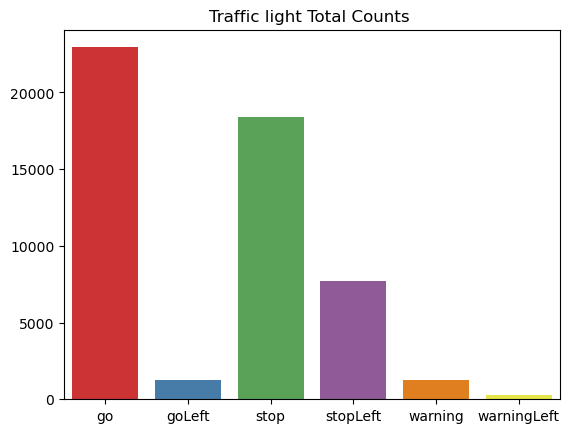

array(['go', 'stop', 'stopLeft', 'warning', 'goLeft', 'warningLeft'],
      dtype=object)

In [33]:
target, counts = np.unique(df['label'], return_counts=True)
import seaborn as sns

# Create a bar plot
ax = sns.barplot(x=target, y=counts, palette=sns.color_palette("Set1"))


# Set the title
ax.set_title('Traffic light Total Counts ')


# Show the plot
plt.show()
annotation_tags = df['label'].unique()
annotation_tags

In [34]:
labels = {
    'go': 0,
 'goLeft': 1,
 'stop': 2,
 'stopLeft': 3,
 'warning': 4,
 'warningLeft': 5}


def get_coords(tag, x_min, y_min, x_max, y_max):
        """
        We will return the 0 for stop, 1 for green.
        Also we will return normalized x_center, y_center, 
        width, and height. We will divice the x_center and width by 
        image width and y_center and height by image height to
        normalize. Each image is 1280 in width and 960 in height. 
        """
        if tag in labels:
            if tag == 'go':
                label = labels['go']
                color = (0, 255, 0)
            elif tag == 'stop':
                label = labels['stop']
                color = (0, 0, 255)
            elif tag == 'stopLeft':
                label = labels['stopLeft']
                color = (0, 0, 155)
            elif tag == 'goLeft':
                label = labels['goLeft']
                color = (0, 200, 200)
            elif tag == 'warning':
                label = labels['warning']
                color = (29, 118, 255)
            elif tag == 'warningLeft':
                label = labels['warningLeft']
                color = (0 , 118, 255)

            return label, x_min, y_min, x_max, y_max, color
        else:
            label = ''
            x_min = ''
            y_min = ''
            x_max = ''
            y_max = ''
            color = 0
            return label, x_min, y_min, x_max, y_max, color


13
dayClip1


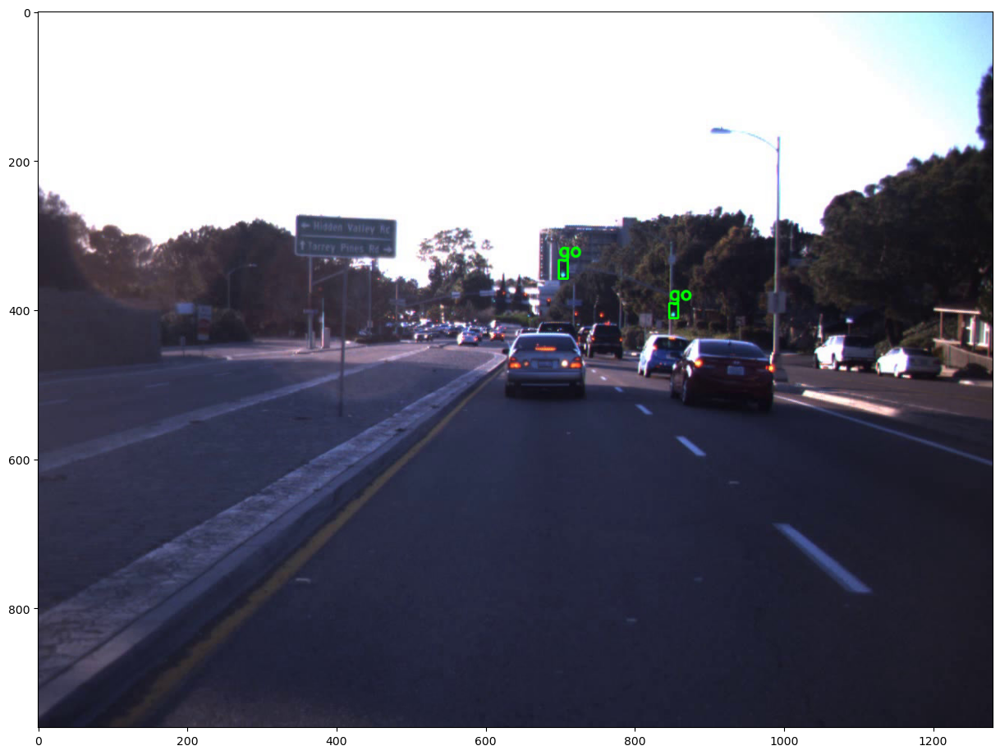

dayClip2


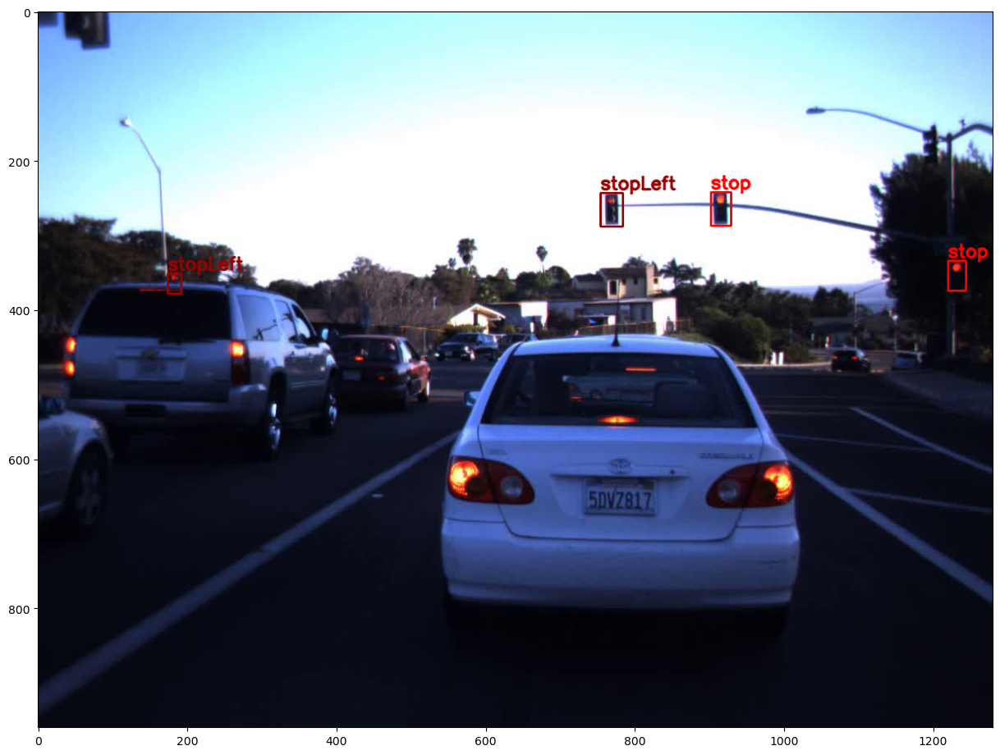

dayClip3


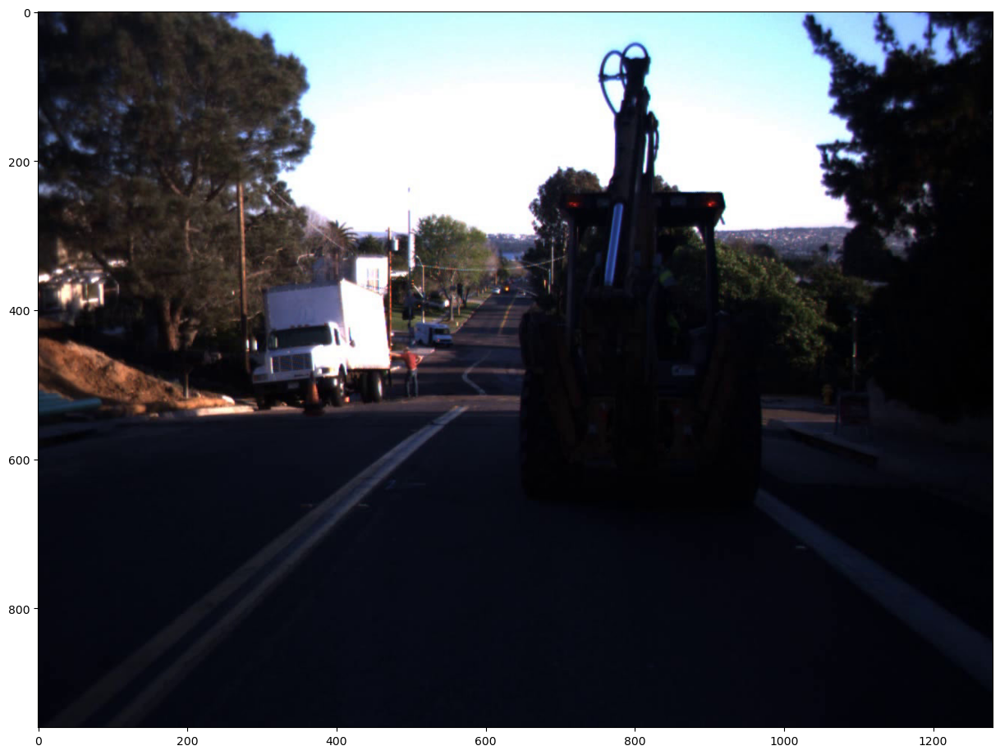

dayClip4


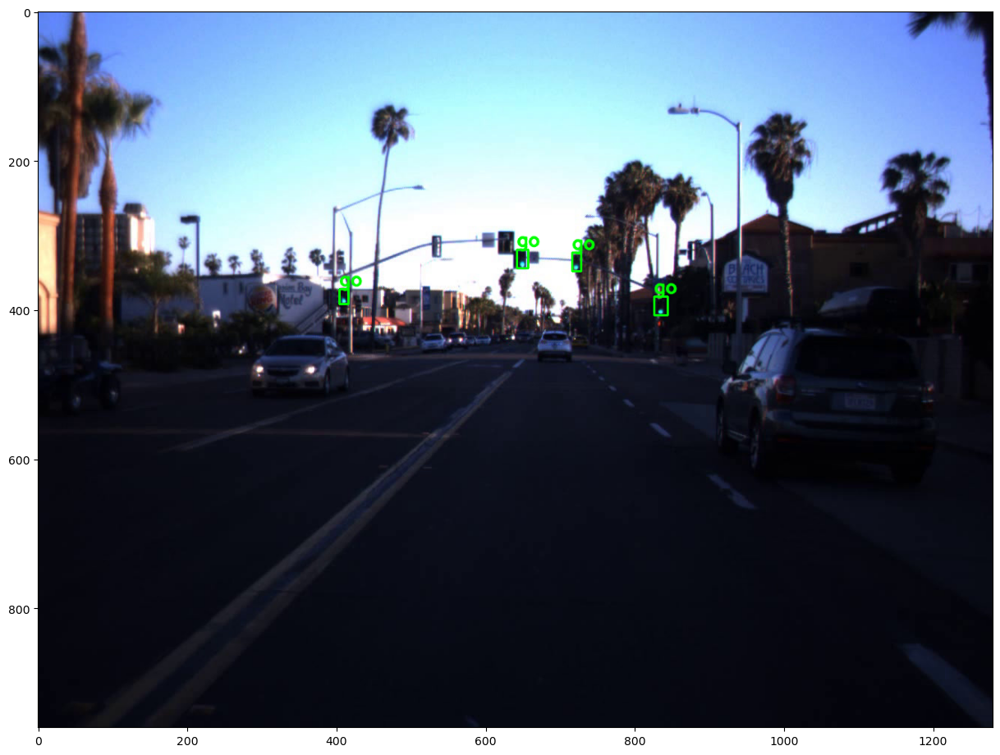

dayClip5


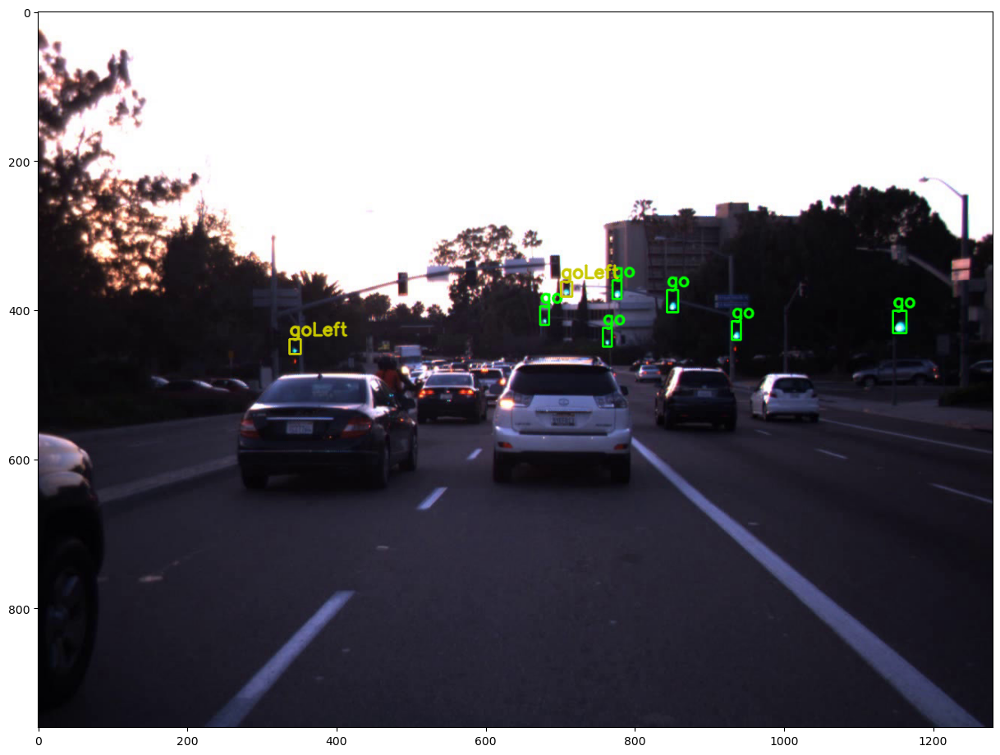

dayClip6


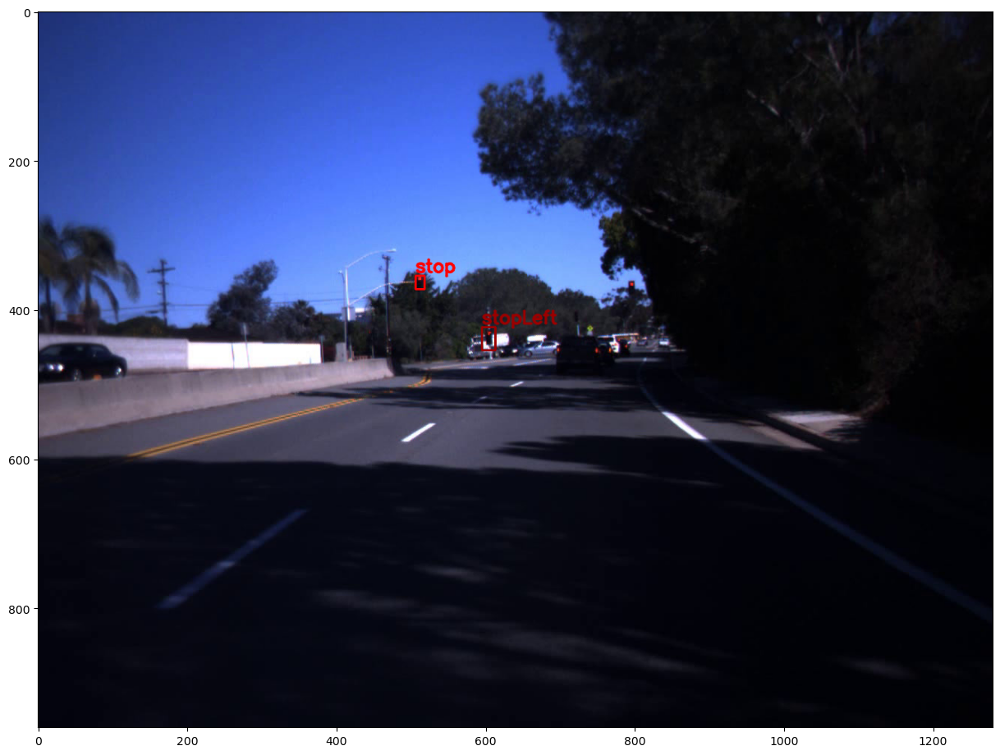

dayClip7


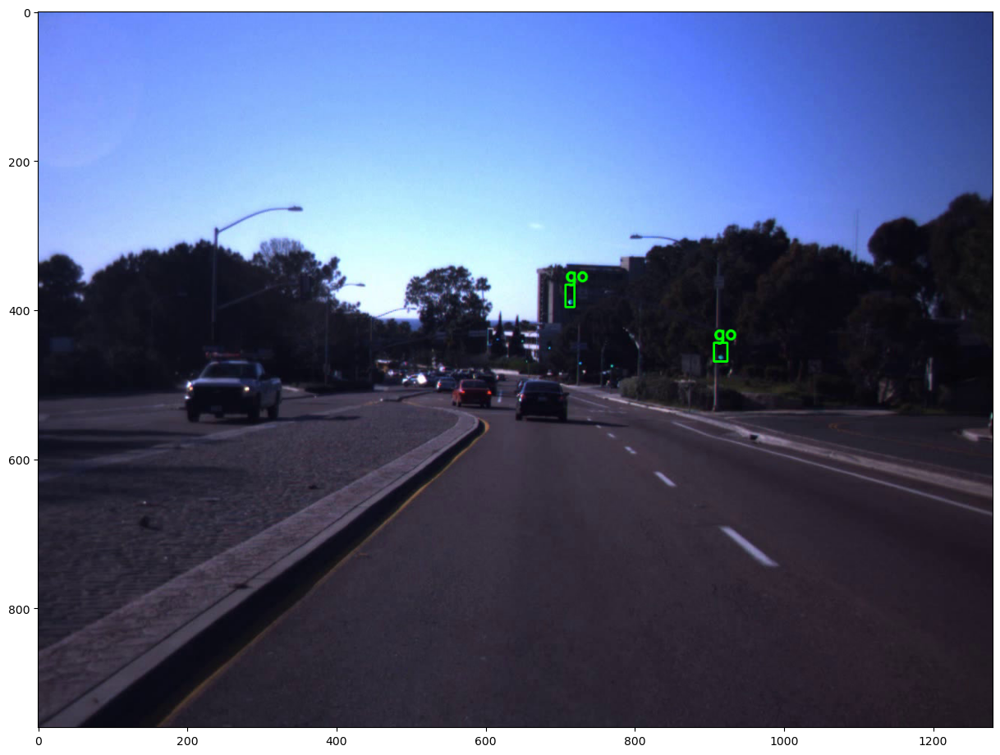

dayClip8


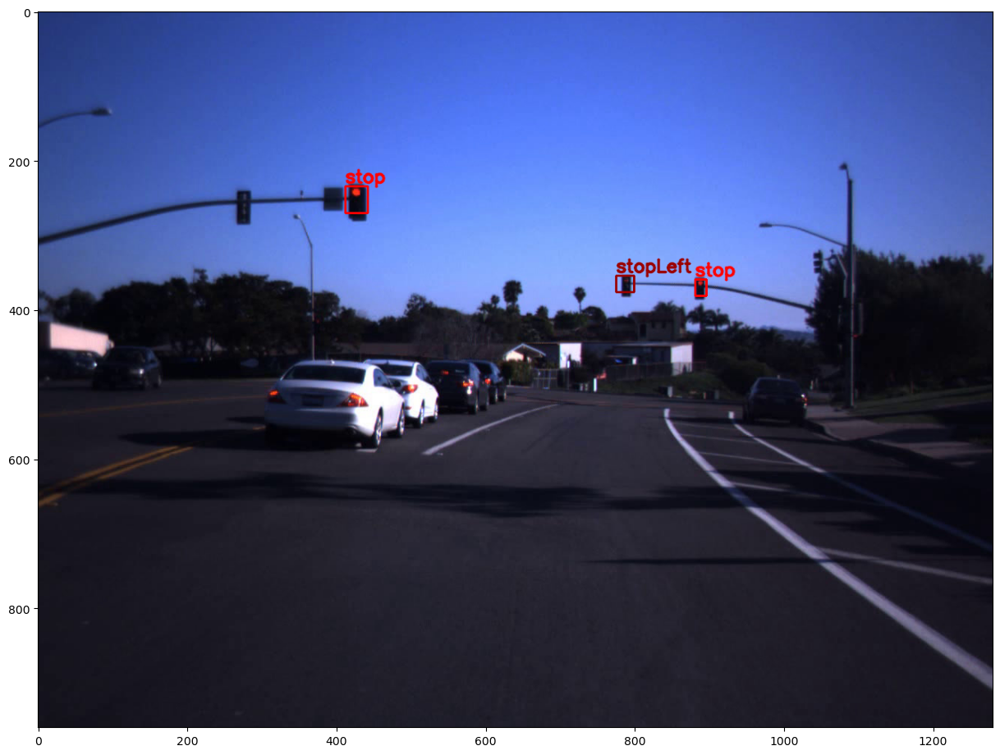

dayClip9


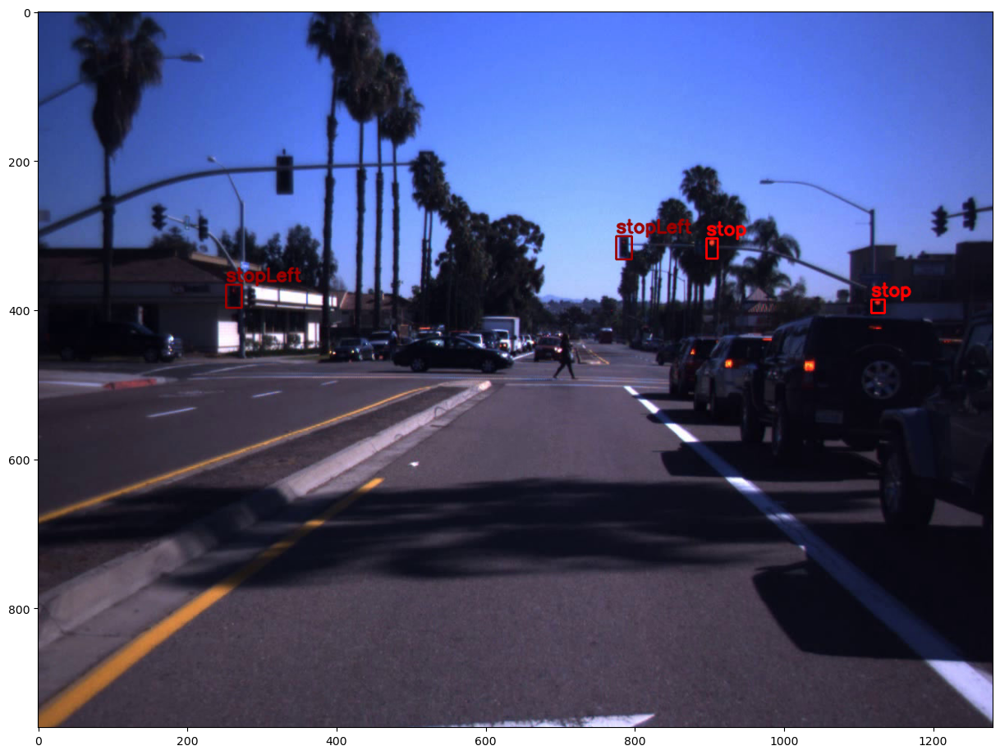

dayClip10


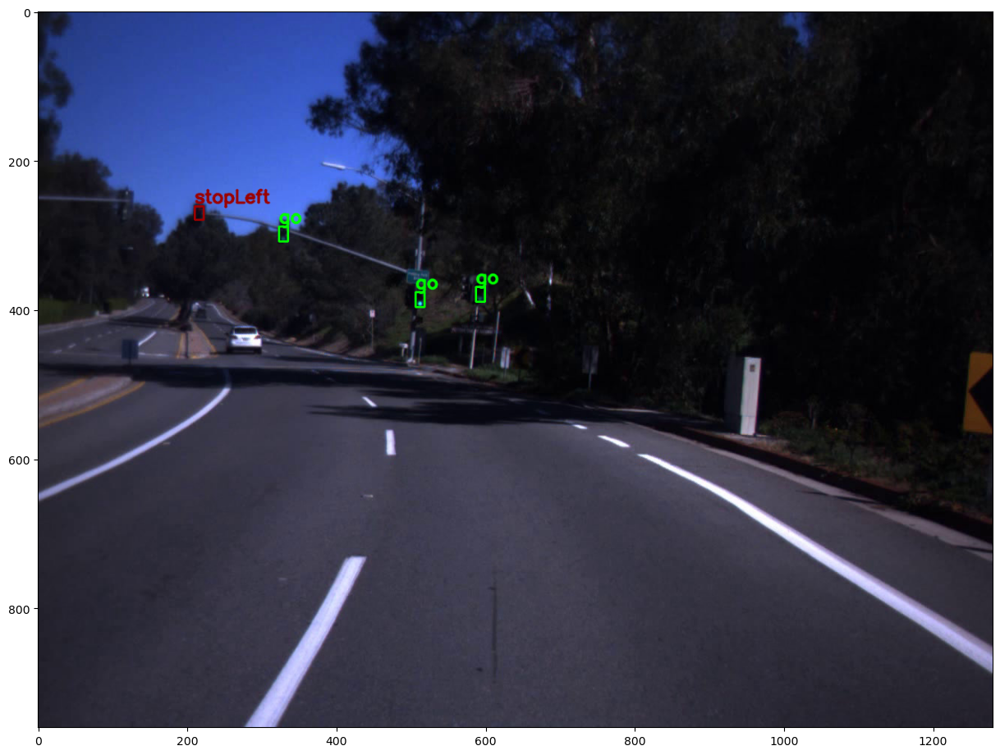

dayClip11


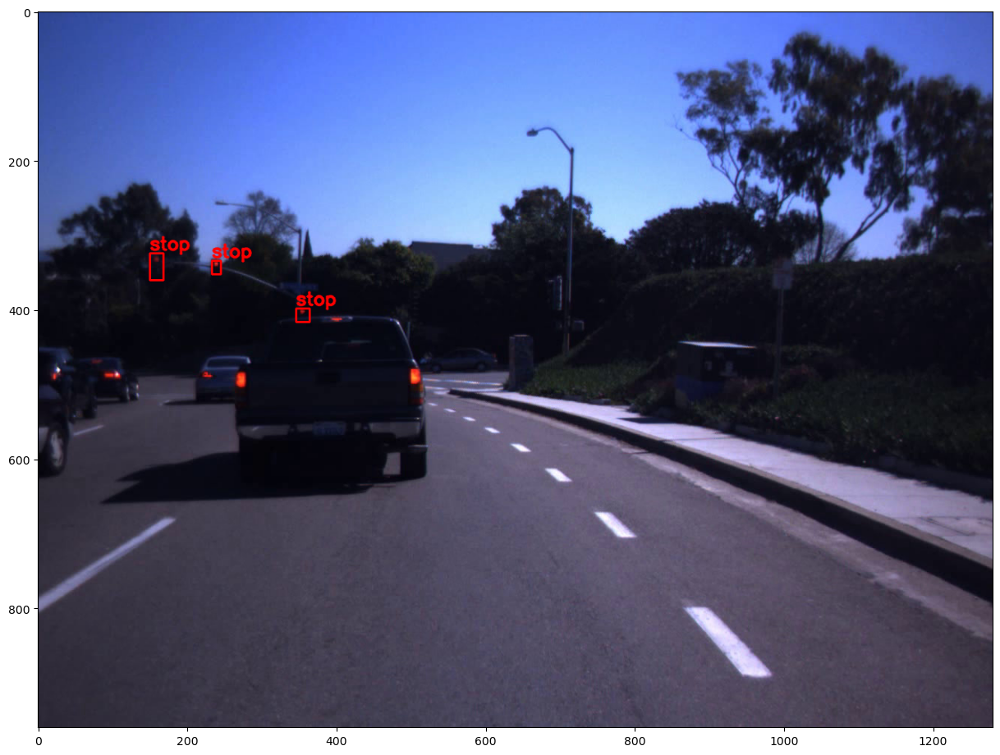

dayClip12


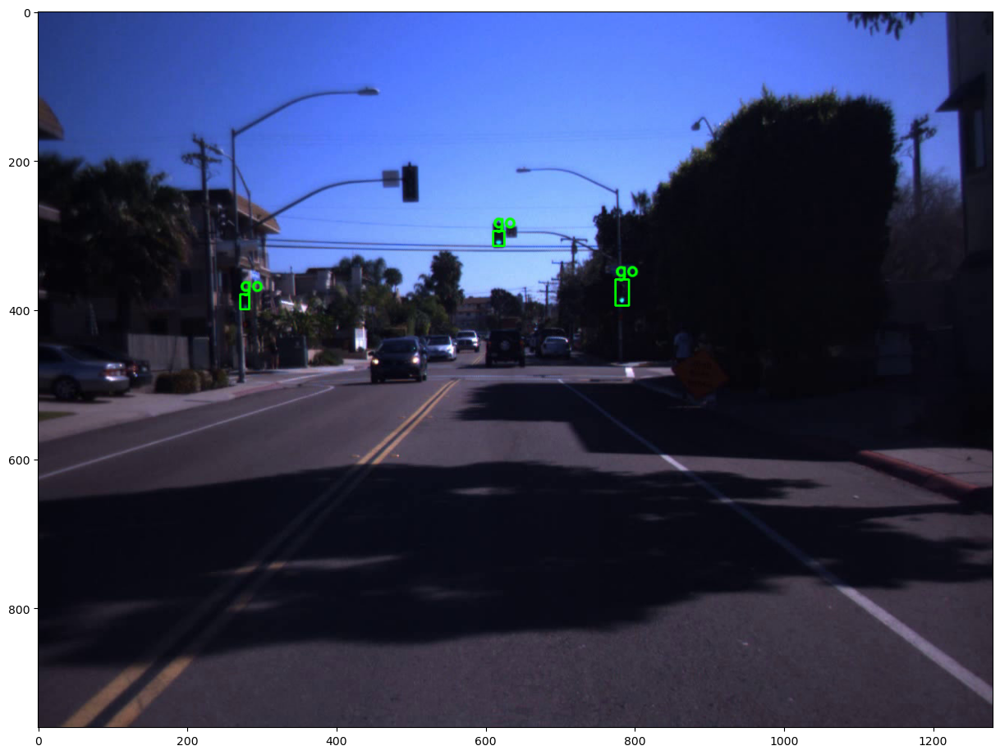

dayClip13


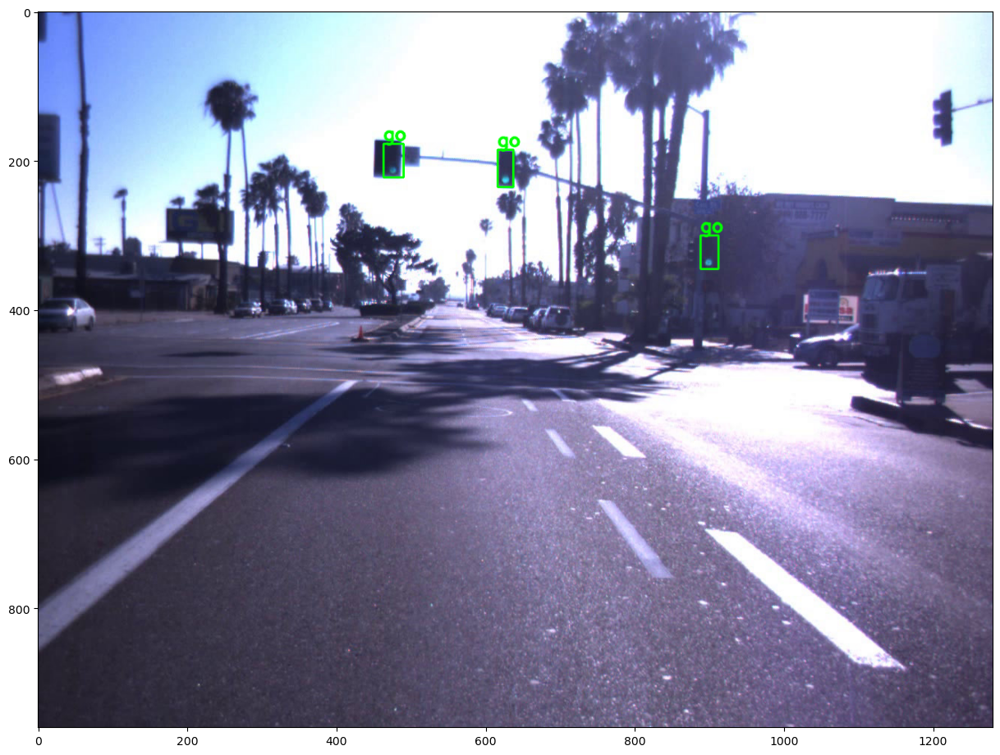

6
nightClip1


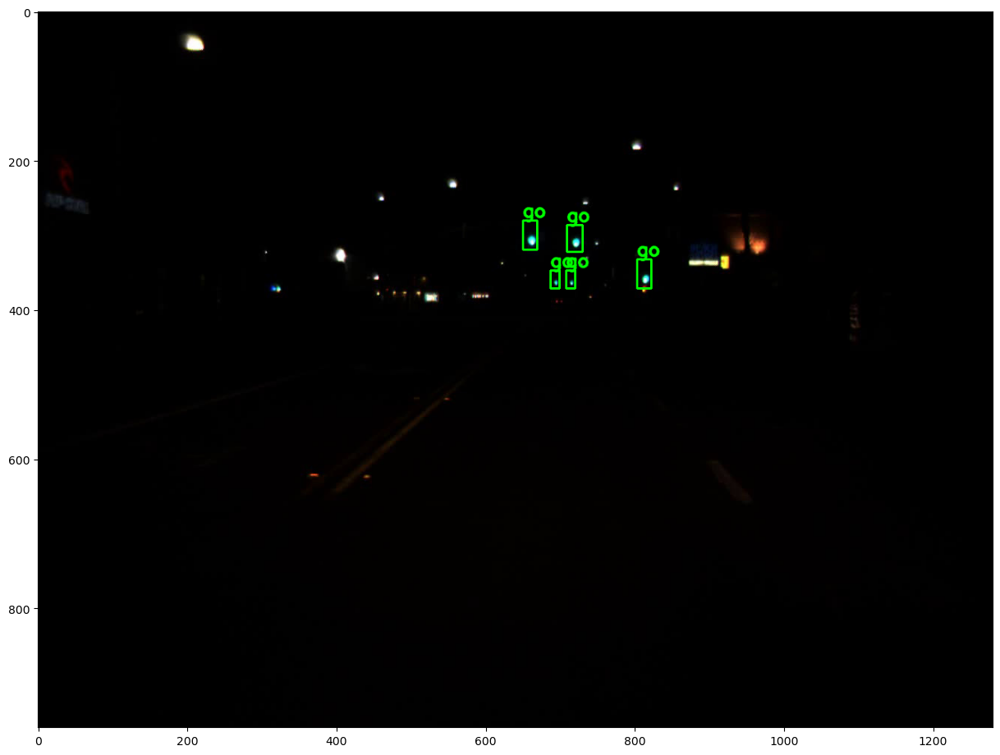

nightClip2


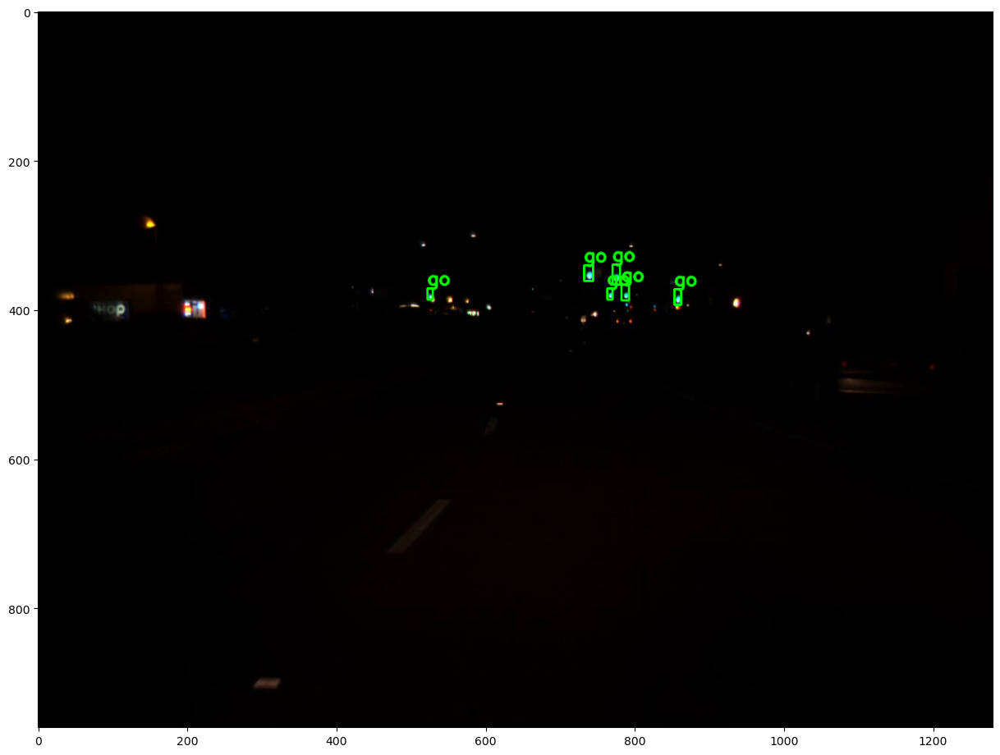

nightClip3


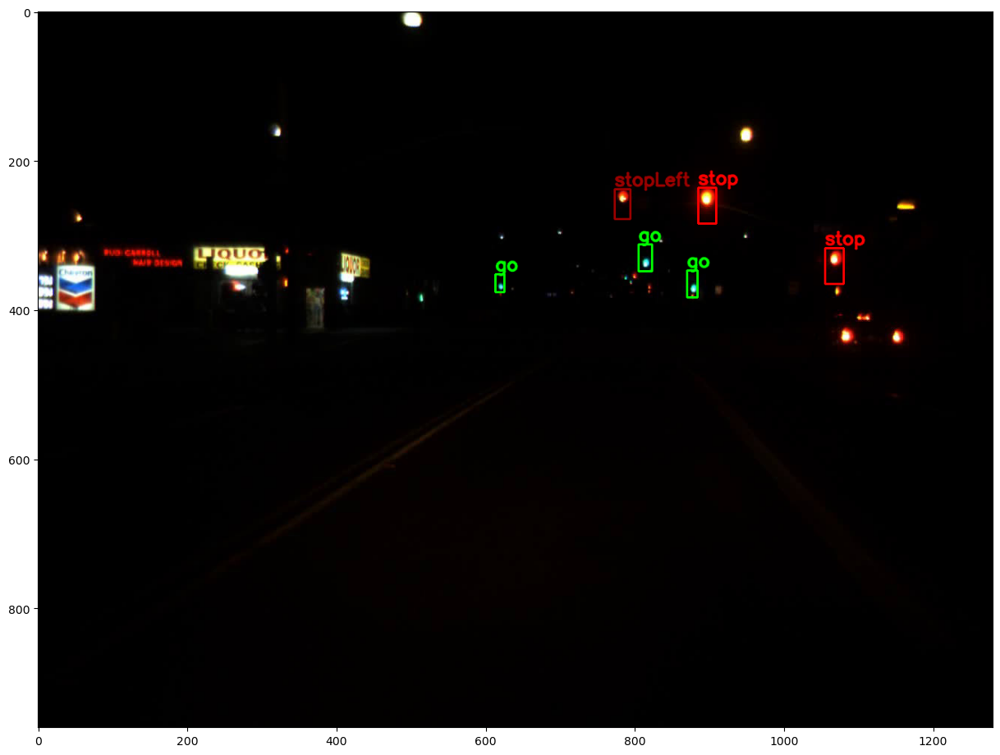

nightClip4


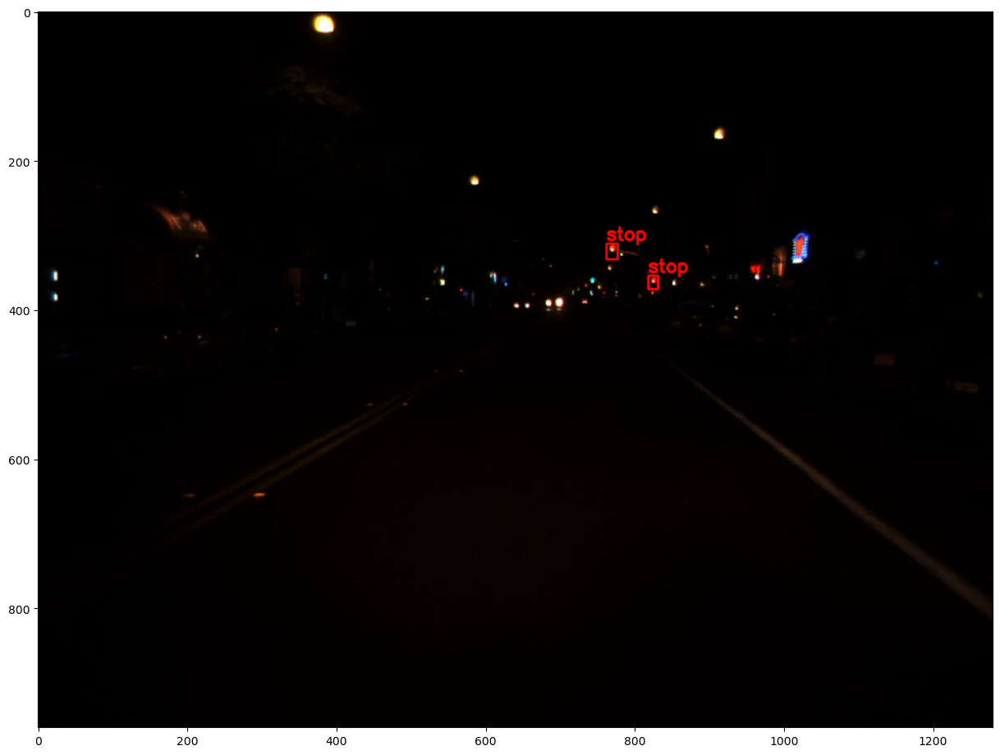

nightClip5


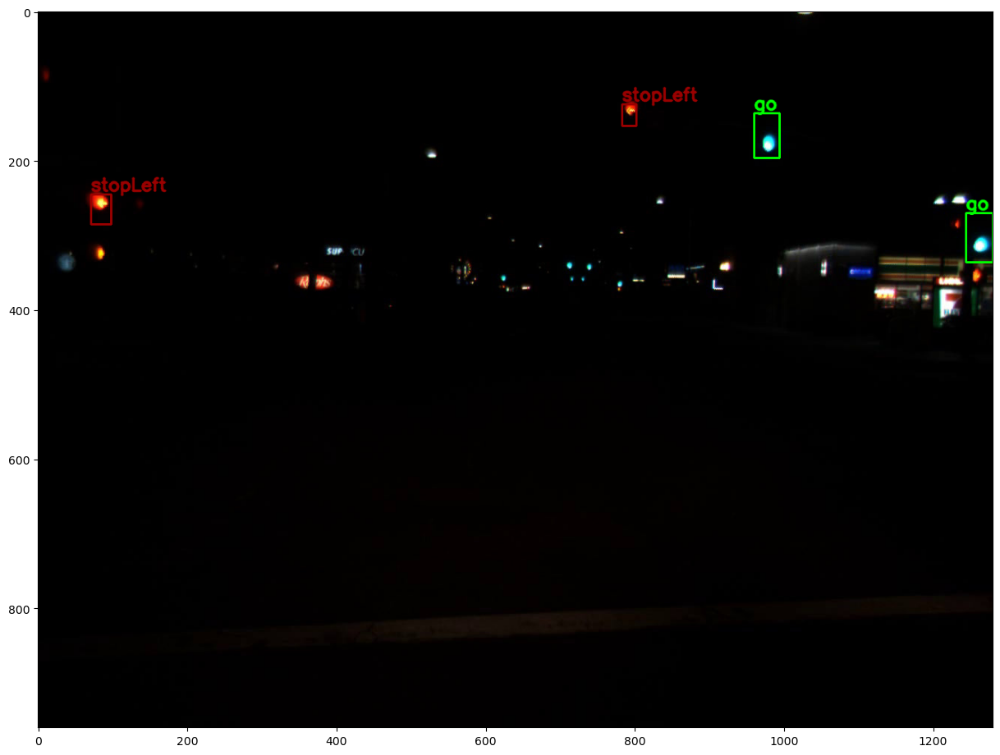

nightClip6


FileNotFoundError: [Errno 2] No such file or directory: './lisa-traffic-light-dataset/Annotations/Annotations/nightTrain/nightClip6/frameAnnotationsBOX.csv'

In [35]:
root_folder_names = ['dayTrain', 'nightTrain']
root_folder_name_mapper = {
    'dayTrain': 'dayClip',
    'nightTrain': 'nightClip'
}

annotation_root = DATA_PATH+'Annotations/Annotations'
image_root = DATA_PATH

for root_folder_name in root_folder_names:
    folder_names = os.listdir(f"{annotation_root}/{root_folder_name}")
    num_folders = len(folder_names)
    print(num_folders)
    mapped_clip = root_folder_name_mapper[root_folder_name]
    
    for i in range(1, num_folders+1):
        print(f"{mapped_clip}{i}")
        new_df = pd.read_csv(f"{annotation_root}/{root_folder_name}/{mapped_clip}{i}/frameAnnotationsBOX.csv", delimiter=';')
        image_paths = glob.glob(f"{image_root}/{root_folder_name}/{root_folder_name}/{mapped_clip}{i}/frames/*.jpg")
        image_paths.sort()

        # extract all tags, 'go==0' or 'stop==1'
        # 'stopLeft==2', 'goLeft==3', 'warning==4', 'warningLeft==5'
        tags = new_df['Annotation tag'].values
        x_min = new_df['Upper left corner X'].values
        y_min = new_df['Upper left corner Y'].values
        x_max = new_df['Lower right corner X'].values
        y_max = new_df['Lower right corner Y'].values


        file_counter = 0 # to counter through CSV file
        # iterate through all image paths
        for image_path in (image_paths):
            image_name = image_path.split(os.path.sep)[-1]
            image = cv2.imread(image_path, cv2.IMREAD_COLOR)
            # iterate through all CSV rows
            for j in range(len(new_df)):
                if file_counter < len(new_df):
                    file_name = new_df.loc[file_counter]['Filename'].split('/')[-1]
                    if file_name == image_name:
                        label, x1, y1, x2, y2, color = get_coords(tags[file_counter], 
                                                    x_min[file_counter],
                                                    y_min[file_counter],
                                                    x_max[file_counter],
                                                    y_max[file_counter])
                        if type(label) == int:
                            cv2.rectangle(image, (x1, y1), (x2, y2), 
                                          color, 2)
                            cv2.putText(image, tags[file_counter], (x1, y1-5),
                                        cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2, 
                                        lineType=cv2.LINE_AA)
                        else: 
                            continue
                    file_counter += 1
                    if file_name != image_name:
                        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                        plt.figure(figsize=(15, 12))
                        plt.imshow(image)
                        plt.show()
                        plt.close()
                        break
            break


# Detection of traffic lights 

In [36]:
# Download pretrained model
MODEL_NAME = 'ssd_mobilenet_v1_coco_11_06_2017'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Actual model that is used for the object detection.
model_path = "./"
PATH_TO_CKPT = model_path + MODEL_NAME + '/frozen_inference_graph.pb'



In [37]:

def download_model():
    import six.moves.urllib as urllib
    import tarfile

    opener = urllib.request.URLopener()
    opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
    tar_file = tarfile.open(MODEL_FILE)
    for file in tar_file.getmembers():
        file_name = os.path.basename(file.name)
        if 'frozen_inference_graph.pb' in file_name:
            tar_file.extract(file, os.getcwd())


def load_graph():
    if not os.path.exists(PATH_TO_CKPT):
        download_model()

    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')

    return detection_graph

def select_boxes(boxes, classes, scores, score_threshold=0, target_class=10):
    """
    :param boxes:
    :param classes:
    :param scores:
    :param target_class: default traffic light id in COCO dataset is 10
    :return:
    """

    sq_scores = np.squeeze(scores)
    sq_classes = np.squeeze(classes)
    sq_boxes = np.squeeze(boxes)

    sel_id = np.logical_and(sq_classes == target_class, sq_scores > score_threshold)

    return sq_boxes[sel_id]

class TLClassifier(object):
    def __init__(self):

        self.detection_graph = load_graph()
        self.extract_graph_components()
        self.sess = tf.Session(graph=self.detection_graph)

        # run the first session to "warm up"
        dummy_image = np.zeros((100, 100, 3))
        self.detect_multi_object(dummy_image,0.1)
        self.traffic_light_box = None
        self.classified_index = 0

    def extract_graph_components(self):
        # Definite input and output Tensors for detection_graph
        self.image_tensor = self.detection_graph.get_tensor_by_name('image_tensor:0')
        # Each box represents a part of the image where a particular object was detected.
        self.detection_boxes = self.detection_graph.get_tensor_by_name('detection_boxes:0')
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        self.detection_scores = self.detection_graph.get_tensor_by_name('detection_scores:0')
        self.detection_classes = self.detection_graph.get_tensor_by_name('detection_classes:0')
        self.num_detections = self.detection_graph.get_tensor_by_name('num_detections:0')
    
    def detect_multi_object(self, image_np, score_threshold):
        """
        Return detection boxes in a image

        :param image_np:
        :param score_threshold:
        :return:
        """

        # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
        image_np_expanded = np.expand_dims(image_np, axis=0)
        # Actual detection.

        (boxes, scores, classes, num) = self.sess.run(
            [self.detection_boxes, self.detection_scores, self.detection_classes, self.num_detections],
            feed_dict={self.image_tensor: image_np_expanded})

        sel_boxes = select_boxes(boxes=boxes, classes=classes, scores=scores,
                                 score_threshold=score_threshold, target_class=10)

        return sel_boxes
    

In [38]:

def crop_roi_image(image_np, sel_box):
    im_height, im_width, _ = image_np.shape
    (left, right, top, bottom) = (sel_box[1] * im_width, sel_box[3] * im_width,
                                  sel_box[0] * im_height, sel_box[2] * im_height)
    cropped_image = image_np[int(top):int(bottom), int(left):int(right), :]
    return cropped_image


In [39]:
tlc=TLClassifier()

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.39 µs


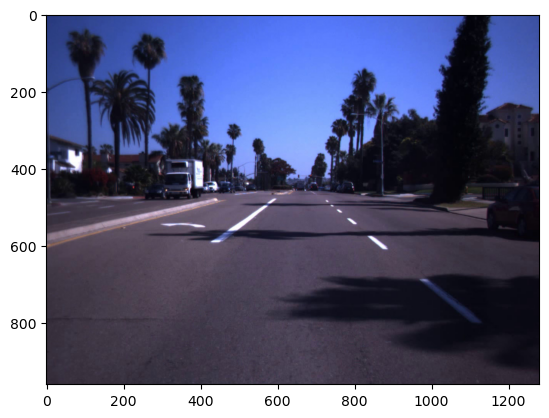

In [40]:
%time
test_file = DATA_PATH+"/daySequence2/daySequence2/frames/daySequence2--00755.jpg"

from PIL import Image
im = Image.open(test_file)
image_np = np.asarray(im)
plt.imshow(image_np)

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 6.2 µs


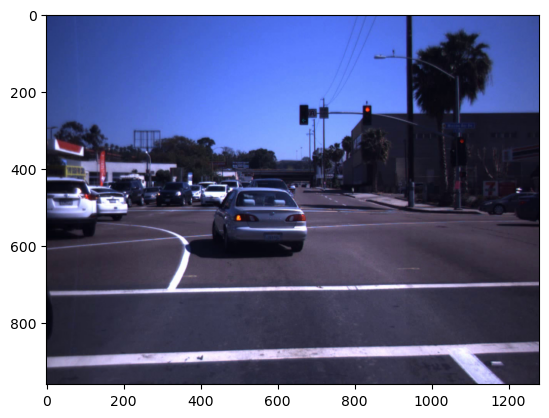

In [41]:
%time
test_file = DATA_PATH+"/daySequence2/daySequence2/frames/daySequence2--06450.jpg"

from PIL import Image
im = Image.open(test_file)
image_np = np.asarray(im)
plt.imshow(image_np)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 4.77 µs
traffic light detected


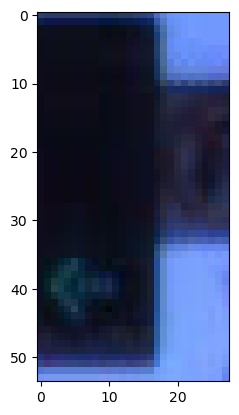

In [42]:
%time

boxes=tlc.detect_multi_object(image_np,score_threshold=0.2)
if len(boxes)>0:
    cropped_image=crop_roi_image(image_np,boxes[0])
    plt.imshow(cropped_image)
    immmm = Image.fromarray(cropped_image)
    immmm.save('./temp.jpg')
    print('traffic light detected')
else:
    print('No traffic light was detected or light is off')

We have to ensure that all the images from a same clip would either be in the train set or in test set. This is to ensure no overlapping train and test set.

In [43]:
df['clip'] = df[['Filename']].applymap(lambda x: x.split('/')[3])
df['clip'].unique()

array(['dayClip1', 'dayClip10', 'dayClip11', 'dayClip12', 'dayClip13',
       'dayClip2', 'dayClip3', 'dayClip4', 'dayClip5', 'dayClip6',
       'dayClip7', 'dayClip8', 'dayClip9', 'nightClip1', 'nightClip2',
       'nightClip3', 'nightClip4', 'nightClip5'], dtype=object)

In [48]:
def train_test_split(df,pct=0.2):
    clipNames = sorted(df['clip'].unique())

    nightClips = [name for name in clipNames if 'nightClip' in name]
    dayClips = [name for name in clipNames if 'dayClip' in name]

    testNightClip = list(np.random.choice(nightClips,int(len(nightClips)*pct)))
    testDayClip = list(np.random.choice(dayClips,int(len(dayClips)*pct)))
    testClip = testNightClip + testDayClip

    trainDayClip= list(set(dayClips) - set(testDayClip))
    trainNightClip = list(set(nightClips) - set(testNightClip))
    trainClip= trainNightClip + trainDayClip
    
    
    train_df = df[df['clip'].isin(trainClip)]
    test_df = df[df['clip'].isin(testClip)]
    
    return train_df, test_df

train_df, test_df = train_test_split(df)
print("Train shape: ",train_df.shape)
train_df.head()

Train shape:  (39154, 9)


,Filename,label,x_min,y_min,x_max,y_max,frame,isNight,clip
0,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,323,288,335,308,0,0,dayClip10
1,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,506,376,518,396,0,0,dayClip10
2,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,587,369,599,389,0,0,dayClip10
3,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,stopLeft,210,261,222,279,0,0,dayClip10
4,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,330,286,342,306,1,0,dayClip10


In [49]:
print("Test shape: ",test_df.shape)
test_df.head()

Test shape:  (12672, 9)


,Filename,label,x_min,y_min,x_max,y_max,frame,isNight,clip
0,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,698,333,710,358,0,0,dayClip1
1,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,846,391,858,411,0,0,dayClip1
2,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,698,337,710,357,1,0,dayClip1
3,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,847,390,859,410,1,0,dayClip1
4,lisa-traffic-light-dataset/dayTrain/dayTrain/d...,go,698,331,710,356,2,0,dayClip1


In [50]:
target, counts = np.unique(train_df['label'], return_counts=True)
target, counts

(array(['go', 'goLeft', 'stop', 'stopLeft', 'warning', 'warningLeft'],
       dtype=object),
 array([17306,  1008, 12150,  7391,  1111,   188]))

In [51]:
target, counts = np.unique(test_df['label'], return_counts=True)
target, counts

(array(['go', 'goLeft', 'stop', 'stopLeft', 'warning', 'warningLeft'],
       dtype=object),
 array([5640,  228, 6232,  316,  147,  109]))

# CNN


In [58]:
train_datagen = ImageDataGenerator(
    # Rescale the images to have a range of [0, 1].
    rescale=1./255,
    
    # Add shear_range=0.2
    shear_range=0.2,

    # Add zoom_range=0.2
    zoom_range=0.2,

    # Randomly flip the images horizontally.
    horizontal_flip=True,

    # Randomly rotate the images.
    rotation_range=40,

    # Fill in any pixels that are outside the image after a rotation with the nearest pixel value.
    fill_mode='nearest',
)

# Set the batch size.
batch_size = 64


# Set the class mode.
class_mode = 'categorical'

# Convert the label column to a categorical variable.
train_df['label'] = pd.Categorical(train_df['label'])


# Build the training set.
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filename',
    y_col='label',
    target_size=(224, 224),
    batch_size = batch_size,
    class_mode = class_mode,
    shuffle = True)

# Image shape
print(train_generator.image_shape)


Found 39154 validated image filenames belonging to 6 classes.
(224, 224, 3)


In [64]:
# Create an instance of Sequential called "classifier"
classifier = Sequential()

# Add a Conv2D layer with the following parameters: 
# filters = 32
# kernel_size = (3,3)
# input_shape = image shape found in part 1
# activation = relu
classifier.add(Conv2D(
    filters = 32, 
    kernel_size = (3, 3), 
    padding='same',
    activation='relu',
    input_shape=train_generator.image_shape)
)

# Add a MaxPooling2D layer where pool_size = (2,2)
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Conv2D layer: 
# filters = 64
# kernel_size = (3,3)
# activation = relu
classifier.add(Conv2D(
    filters = 64, 
    kernel_size = (3, 3), 
    activation = 'relu')
)

# Add a MaxPooling2D layer where pool_size = (2,2)
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add a Flatten layer
classifier.add(Flatten())

# Add a Dense layer
# units = 128
# activation = relu
classifier.add(Dense(
    units = 128, 
    activation = 'relu')
)

# Add a final Dense layer (this will output our probabilities):
# units = # of classes
# activation = softmax 
classifier.add(Dense(
    units = 6, 
    activation = 'softmax')
)

# Compile with the following: 
# optimize = adam
# loss = categorical cross entropy
# metric = accuracy
classifier.compile(
    optimizer = 'adam', 
    loss = 'categorical_crossentropy', 
    metrics = ['accuracy']
)

In [65]:
classifier.fit_generator(
    train_generator,
    steps_per_epoch = 3,
    epochs = 3
)

Epoch 1/3


2023-05-26 18:38:56.997815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


3/3 [==============================] - 12s 3s/step - loss: 8.6980 - accuracy: 0.2396
Epoch 2/3
3/3 [==============================] - 12s 4s/step - loss: 8.4137 - accuracy: 0.3490
Epoch 3/3
3/3 [==============================] - 10s 3s/step - loss: 1.7957 - accuracy: 0.4427


In [66]:
train_generator.class_indices

{'go': 0,
 'goLeft': 1,
 'stop': 2,
 'stopLeft': 3,
 'warning': 4,
 'warningLeft': 5}

In [67]:
# save model
classifier.save('my_model.h5')
print("Saved model")

Saved model


In [70]:
%timeit
# returns a compiled model
# identical to the previous one
model = load_model('my_model.h5')
print("Loaded model from disk")

# Get the filenames column
filenames = test_df['Filename']

# # Iterate over the filenames
# for filename in filenames:
# # print the files in the dataset_test folder 
#     print(filename)
    
# make a prediction and add to results 
data = []
results = []
for f1 in filenames:
    img = image.load_img(f1, target_size = (224, 224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis = 0)
    data.append(img)
    result = model.predict(img)
    r = np.argmax(result, axis=1)
    results.append(r)


Loaded model from disk
1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 52ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 47ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 30ms/step


In [71]:
test_df['label']=test_df['label'].replace({
  'go':0,
 'goLeft':1,
 'stop':2,
 'stopLeft':3,
 'warning':4,
 'warningLeft':5})

In [72]:
# For model with steps_per_epoch = 3 and epochs = 3

# Calculate the accuracy
accuracy = accuracy_score(test_df['label'], results)
print(accuracy)

# Calculate the confusion matrix
confusion_matrix = confusion_matrix(test_df['label'],results)

# Create a classification report
classification_report = classification_report(test_df['label'], results)

# Print the confusion matrix
#print(confusion_matrix)

# Print the classification report
print(classification_report)

0.4786142676767677
              precision    recall  f1-score   support

           0       0.44      0.20      0.27      5640
           1       0.00      0.00      0.00       228
           2       0.49      0.80      0.61      6232
           3       0.00      0.00      0.00       316
           4       0.00      0.00      0.00       147
           5       0.00      0.00      0.00       109

    accuracy                           0.48     12672
   macro avg       0.15      0.17      0.15     12672
weighted avg       0.44      0.48      0.42     12672



In [81]:
test_df['label'].unique()

array(['go', 'stopLeft', 'stop', 'warning', 'goLeft'], dtype=object)

In [74]:
# Running the process for different given combination
steps_per_epoch_iterations = [ 1, 2, 2, 2, 3, 3]
epochs_iterations = [3, 4, 5, 6, 7, 8]

# Run through different iterations
for values in range(len(steps_per_epoch_iterations)):
    classifier.fit_generator(
        train_generator,
        steps_per_epoch = steps_per_epoch_iterations[values],
        epochs = epochs_iterations[values],
        )
    classifier.save('my_model_' + str(values) + '.h5')
    print("Saved model - "+ str(values))

Epoch 1/3


2023-05-26 22:48:25.966574: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


1/1 [==============================] - 7s 7s/step - loss: 1.4564 - accuracy: 0.4688
Epoch 2/3
1/1 [==============================] - 4s 4s/step - loss: 1.4869 - accuracy: 0.4219
Epoch 3/3
1/1 [==============================] - 4s 4s/step - loss: 1.5729 - accuracy: 0.3750
Saved model - 0
Epoch 1/4


2023-05-26 22:48:47.038815: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


2/2 [==============================] - 6s 3s/step - loss: 1.4589 - accuracy: 0.4766
Epoch 2/4
2/2 [==============================] - 6s 3s/step - loss: 1.5846 - accuracy: 0.4531
Epoch 3/4
2/2 [==============================] - 6s 2s/step - loss: 1.4847 - accuracy: 0.5234
Epoch 4/4
2/2 [==============================] - 6s 3s/step - loss: 1.3826 - accuracy: 0.4531
Saved model - 1
Epoch 1/5


2023-05-26 22:49:15.684132: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


2/2 [==============================] - 6s 3s/step - loss: 1.2439 - accuracy: 0.4922
Epoch 2/5
2/2 [==============================] - 6s 3s/step - loss: 1.2570 - accuracy: 0.5234
Epoch 3/5
2/2 [==============================] - 6s 3s/step - loss: 1.2123 - accuracy: 0.4688
Epoch 4/5
2/2 [==============================] - 6s 2s/step - loss: 1.2422 - accuracy: 0.4609
Epoch 5/5
2/2 [==============================] - 6s 3s/step - loss: 1.1473 - accuracy: 0.4688
Saved model - 2
Epoch 1/6


2023-05-26 22:49:50.509019: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


2/2 [==============================] - 6s 3s/step - loss: 1.3227 - accuracy: 0.4766
Epoch 2/6
2/2 [==============================] - 6s 3s/step - loss: 1.1454 - accuracy: 0.4219
Epoch 3/6
2/2 [==============================] - 7s 3s/step - loss: 1.0958 - accuracy: 0.4766
Epoch 4/6
2/2 [==============================] - 7s 3s/step - loss: 1.2189 - accuracy: 0.5078
Epoch 5/6
2/2 [==============================] - 7s 3s/step - loss: 1.2564 - accuracy: 0.4922
Epoch 6/6
2/2 [==============================] - 7s 3s/step - loss: 1.2530 - accuracy: 0.4062
Saved model - 3
Epoch 1/7


2023-05-26 22:50:34.373004: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


3/3 [==============================] - 9s 3s/step - loss: 1.2688 - accuracy: 0.4219
Epoch 2/7
3/3 [==============================] - 9s 3s/step - loss: 1.2641 - accuracy: 0.4479
Epoch 3/7
3/3 [==============================] - 9s 3s/step - loss: 1.2722 - accuracy: 0.3958
Epoch 4/7
3/3 [==============================] - 9s 3s/step - loss: 1.1303 - accuracy: 0.4844
Epoch 5/7
3/3 [==============================] - 8s 2s/step - loss: 1.1887 - accuracy: 0.4323
Epoch 6/7
3/3 [==============================] - 9s 3s/step - loss: 1.2733 - accuracy: 0.4792
Epoch 7/7
3/3 [==============================] - 9s 3s/step - loss: 1.2396 - accuracy: 0.4583
Saved model - 4
Epoch 1/8


2023-05-26 22:51:41.621290: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


3/3 [==============================] - 9s 3s/step - loss: 1.1812 - accuracy: 0.4792
Epoch 2/8
3/3 [==============================] - 8s 2s/step - loss: 1.1899 - accuracy: 0.4740
Epoch 3/8
3/3 [==============================] - 8s 3s/step - loss: 1.2331 - accuracy: 0.4427
Epoch 4/8
3/3 [==============================] - 9s 3s/step - loss: 1.1702 - accuracy: 0.4688
Epoch 5/8
3/3 [==============================] - 8s 2s/step - loss: 1.2138 - accuracy: 0.4896
Epoch 6/8
3/3 [==============================] - 8s 2s/step - loss: 1.1869 - accuracy: 0.4583
Epoch 7/8
3/3 [==============================] - 8s 3s/step - loss: 1.1075 - accuracy: 0.5521
Epoch 8/8
3/3 [==============================] - 8s 2s/step - loss: 1.2093 - accuracy: 0.5156
Saved model - 5


In [75]:
n_batch = 5 # steps_per_epoch
n_epochs = 10 # epochs

# loop through epochs
for e in range(n_epochs):
    print('Epoch', e)
    batches = 0
    # loop through batches
    for x_batch, y_batch in train_datagen.flow_from_dataframe( dataframe=train_df,
                                                              x_col='Filename',
                                                              y_col='label',
                                                              target_size=(224, 224), 
                                                              class_mode = 'categorical', 
                                                              seed = 42):
        classifier.fit(x_batch, y_batch)
        classifier.save('my_model_9.h5')
        batches += 1
        if batches >= n_batch:
            # we need to break the loop by hand because the generator loops indefinitely
            break

Epoch 0
Found 39154 validated image filenames belonging to 6 classes.
1/1 [==============================] - 1s 945ms/step - loss: 0.8902 - accuracy: 0.6250
Epoch 1
Found 39154 validated image filenames belonging to 6 classes.
1/1 [==============================] - 1s 968ms/step - loss: 0.8223 - accuracy: 0.6250
Epoch 2
Found 39154 validated image filenames belonging to 6 classes.
1/1 [==============================] - 1s 951ms/step - loss: 0.6547 - accuracy: 0.7188
Epoch 3
Found 39154 validated image filenames belonging to 6 classes.
1/1 [==============================] - 1s 957ms/step - loss: 0.4536 - accuracy: 0.9062
Epoch 4
Found 39154 validated image filenames belonging to 6 classes.
1/1 [==============================] - 1s 963ms/step - loss: 0.2675 - accuracy: 0.9688
Epoch 5
Found 39154 validated image filenames belonging to 6 classes.
1/1 [==============================] - 1s 979ms/step - loss: 0.1323 - accuracy: 1.0000
Epoch 6
Found 39154 validated image filenames belonging to

In [76]:

# Initialize accuracy_results
accuracy_results = []

# Loop through the 10 model outputs created above and generate accuracy results
for values in range(10):
    
    # Run accuracy result from Step 3 c:
    model = load_model('my_model_' + str(values) + '.h5')
    print("Loaded model from disk")

    # Get the filenames column
    filenames = test_df['Filename']
#     # print the files in the dataset_test folder 
#     for f in filenames:
#         print(f)

    # make a prediction and add to results 
    data = []
    results = []
    for f1 in filenames:
        img = image.load_img(f1, target_size = (224,224))
        img = image.img_to_array(img)
        img = np.expand_dims(img, axis = 0)
        data.append(img)
        result = model.predict(img)
        r = np.argmax(result, axis=1)
        results.append(r)
    
    score = accuracy_score(results, test_df['label'])
    accuracy_results.append(score)
    
accuracy_results

Loaded model from disk
1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 49ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 40ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 32ms/step


KeyboardInterrupt: 

In [ ]:
steps_per_epoch_all = [ 1, 2, 2, 2, 3, 3]
epochs_all = [3, 4, 5, 6, 7, 8]

combined_result_df = pd.DataFrame({
    'Steps per Epoch' : steps_per_epoch_all,
    'Epochs' : epochs_all,
    'Accuracy' : accuracy_results
})

combined_result_df

In [77]:
%timeit
# returns a compiled model
# identical to the previous one
model = load_model('my_model_9.h5')
print("Loaded model from disk")

# Get the filenames column
filenames = test_df['Filename']

# # Iterate over the filenames
# for filename in filenames:
# # print the files in the dataset_test folder 
#     print(filename)
    
# make a prediction and add to results 
data = []
results = []
for f1 in filenames:
    img = image.load_img(f1, target_size = (224,224))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis = 0)
    data.append(img)
    result = model.predict(img)
    r = np.argmax(result, axis=1)
    results.append(r)
    


Loaded model from disk
1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 55ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 57ms/step


1/1 [==============================] - 0s 58ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 39ms/step


1/1 [==============================] - 0s 44ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 37ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 56ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 35ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 42ms/step


1/1 [==============================] - 0s 85ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 36ms/step


1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 46ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 33ms/step


1/1 [==============================] - 0s 30ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 32ms/step


1/1 [==============================] - 0s 43ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 31ms/step


1/1 [==============================] - 0s 29ms/step


1/1 [==============================] - 0s 34ms/step


1/1 [==============================] - 0s 30ms/step


TypeError: 'numpy.ndarray' object is not callable

In [84]:
#accuracy score
accuracy_score= accuracy_score(test_df.loc[:,'label'], results)
print(accuracy_score)

# Calculate the confusion matrix
confusion_matrix = confusion_matrix(test_df.loc[:,'label'], results)

# Create a classification report
classification_report = classification_report(test_df.loc[:,'label'], results, target_names=['go', 'goLeft', 'stop', 'stopLeft', 'warning', 'warningLeft'])

# Print the confusion matrix
print(confusion_matrix)

# Print the classification report
print(classification_report)

TypeError: 'numpy.float64' object is not callable